In [1]:
from pathlib import Path
import pandas as pd
import os
import shutil
import hashlib
import seaborn as sns
from IPython.display import display
from pytorch_grad_cam import GradCAM
import time

In [2]:
import sys
print(sys.executable)

/opt/anaconda3/envs/t3_project/bin/python


In [3]:
!{sys.executable} -m pip list | grep torch

torch                     2.4.1
torchvision               0.19.1


In [4]:
import torch

In [5]:
import torchvision
import matplotlib.pyplot as plt
import numpy as np

In [6]:
os.getcwd()
os.chdir("..")
os.getcwd()

'/Users/kalyanivenkateswaran/Documents/T3_Project/waste_classification'

In [7]:
BASE_DIR = Path.cwd()
META_DIR = BASE_DIR / "data" / "metadata"
file1=META_DIR/"consolidated_metatdata.csv"

In [8]:
metadata_df = pd.read_csv(file1)

In [9]:
from sklearn.model_selection import train_test_split


train_df, temp_df = train_test_split(
    metadata_df,
    test_size=0.30,          # 70 train / 30 temp
    stratify=metadata_df["stage2_label"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,          # 15 / 15
    stratify=temp_df["stage2_label"],
    random_state=42
)

In [10]:
metadata_df.loc[metadata_df["filepath"].isin(train_df["filepath"]), "split"] = "train"
metadata_df.loc[metadata_df["filepath"].isin(test_df["filepath"]), "split"] = "test"
metadata_df.loc[metadata_df["filepath"].isin(val_df["filepath"]), "split"] = "val"

In [11]:
metadata_df

,filepath,stage1_label,stage2_label,source,type,split_key,split
0,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Non_Organic,MendleyGCdataset,clean,Non_Organic_clean,val
1,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Non_Organic,MendleyGCdataset,clean,Non_Organic_clean,train
2,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Non_Organic,MendleyGCdataset,clean,Non_Organic_clean,train
3,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Non_Organic,MendleyGCdataset,clean,Non_Organic_clean,train
4,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,Non_Organic,MendleyGCdataset,clean,Non_Organic_clean,val
...,...,...,...,...,...,...,...
67601,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,train
67602,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,train
67603,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,train
67604,/Users/kalyanivenkateswaran/Documents/T3_Proje...,Non_Organic,White_Glass,garbage,clean,White_Glass_clean,val


### Define transforms

In [12]:
from torchvision import transforms

In [13]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [14]:
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

### Custom waste dataset to read from metadata

In [15]:
# Define custom Dataset -> this will help you load images from your csv file
from torch.utils.data import Dataset
from PIL import Image

class CustomWasteData(Dataset):
    def __init__(self, csv_df, split,label_col, transform=None):
        self.df = csv_df
        self.df = self.df[self.df["split"] == split].reset_index(drop=True)
        
        self.transform = transform
        self.label_col = label_col
        
        self.classes = sorted(self.df[label_col].unique())
        self.class_to_idx = {
            cls: i for i, cls in enumerate(self.classes)
        }

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img = Image.open(row["filepath"]).convert("RGB")
        label = self.class_to_idx[row[self.label_col]]
        source = row["source"]     
        type_image = row["type"]    

        if self.transform:
            img = self.transform(img)

        return img, label, source, type_image

In [16]:
# Creating datasets - Stage 1 
train_ds_stage1 = CustomWasteData(
    metadata_df,
    split="train",
    label_col="stage1_label",
    transform=train_transform
)

val_ds_stage1 = CustomWasteData(
    metadata_df,
    split="val",
    label_col="stage1_label",
    transform=val_transform
)


In [17]:
len(train_ds_stage1)

47324

### Data Loaders

In [18]:
from torch.utils.data import DataLoader

train_loader_s1 = DataLoader(
    train_ds_stage1,
    batch_size=32,
    shuffle=True,
    num_workers=0
)

val_loader_s1 = DataLoader(
    val_ds_stage1,
    batch_size=32,
    shuffle=False,
    num_workers=0
)


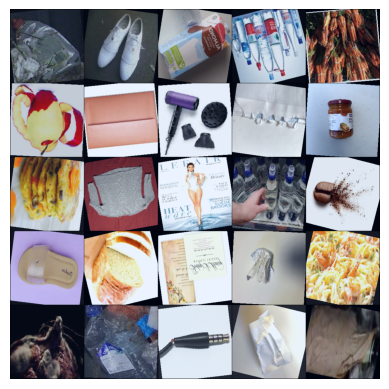

In [19]:
dataiter = iter(train_loader_s1)
images, labels, sources, type_images = next(dataiter)
plt.imshow(np.transpose(torchvision.utils.make_grid(
    images[:25], normalize=True, padding=1, nrow=5).numpy(), (1, 2, 0)))
plt.axis('off')
plt.show()

In [20]:
# Get one batch
images, labels, sources, type_images = next(iter(train_loader_s1))

print(images.shape)   # (batch, 3, 224, 224)

torch.Size([32, 3, 224, 224])


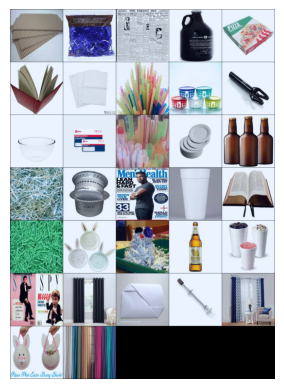

In [21]:
dataiter = iter(val_loader_s1)
images, labels , sources, type_images= next(dataiter)
plt.imshow(np.transpose(torchvision.utils.make_grid(
    images[:32], normalize=True, padding=1, nrow=5).numpy(), (1, 2, 0)))
plt.axis('off')
plt.show()

In [22]:
train_df["type"].value_counts()

type
clean         35898
real_world    11426
Name: count, dtype: int64

In [23]:
device = torch.device("mps")

In [24]:
print("MPS available:", torch.backends.mps.is_available())
print("MPS built:", torch.backends.mps.is_built())

MPS available: True
MPS built: True


### Building the CNN architecture - ResNet34

In [25]:
from torchvision.models import resnet34, ResNet34_Weights
class CNN_stage1_r34(torch.nn.Module):
    def __init__(self, num_classes, input_size=(224, 224), channels=3):
        super(CNN_stage1_r34, self).__init__()

        self.input_size = input_size
        self.channels = channels

        self.network = resnet34(weights=ResNet34_Weights.DEFAULT)

        num_features = self.network.fc.in_features
        self.network.fc = torch.nn.Linear(num_features, 2)

    def forward(self, x):
        return self.network(x)

    def freeze(self):

        # Freeze all layers
        for param in self.network.parameters():
            param.requires_grad = False

        # Unfreeze final classifier layer
        for param in self.network.fc.parameters():
            param.requires_grad = True

    def unfreeze(self):

        for param in self.network.parameters():
            param.requires_grad = True

In [26]:
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device("mps")
model = CNN_stage1_r34(2).to(device)

model.freeze()   

learning_rate = 0.001

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=learning_rate
)

criterion = torch.nn.CrossEntropyLoss()
num_epochs = 5
batch_size = 32

In [27]:
torch.backends.mps.is_available()

True

In [52]:
import time

start = time.time()

for i, (imgs, labels, sources, type_images) in enumerate(train_loader_s1):
    if i == 50:
        break

print("50 batches time:", time.time() - start)

50 batches time: 5.912795305252075


In [53]:
epoch_time = (5.912795305252075/ 50) * 1479
epoch_time

174.90048512935638

In [28]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 21285698


In [29]:
print(model)

CNN_stage1_r34(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

In [30]:
print("MPS available:", torch.backends.mps.is_available())
print("MPS built:", torch.backends.mps.is_built())

MPS available: True
MPS built: True


In [31]:
print(next(model.parameters()).device)

mps:0


In [32]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import matthews_corrcoef

In [35]:
# Training loop
epoch_times = []
train_acc_list = []
train_loss_list = []
val_acc_list = []
val_loss_list= []
for epoch in range(num_epochs):
    start = time.time()
    model.train()
    running_loss = 0.0
    train_loss = 0.0
    train_accuracy = 0.0
    all_predictions = []
    all_labels = []
    for images, labels, sources, type_images in train_loader_s1:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Average loss and accuracy
    train_loss = running_loss / len(train_loader_s1)
    train_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    train_loss_list.append(train_loss)
    train_acc_list.append(train_accuracy)
        
    end = time.time()
    epoch_time = end - start
    epoch_times.append(epoch_time)

    print(f"Epoch {epoch+1} time: {epoch_time:.2f} sec")
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.4f}')
    

    model.eval()
    all_predictions = []
    all_labels = []
    running_loss = 0.0
    val_loss = 0.0
    val_accuracy = 0.0
    with torch.no_grad():
        for images, labels, sources, type_images in val_loader_s1:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss = running_loss / len(val_loader_s1)
    val_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    val_loss_list.append(val_loss)
    val_acc_list.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Accuracy: {val_accuracy:.4f}')
    print('-----------------------------')

total_time = sum(epoch_times)
print(f"Total training time: {total_time/60:.2f} minutes")


/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1 time: 328.74 sec
Epoch [1/5], Training Loss: 0.2198
Epoch [1/5], Training Accuracy: 91.5159
Epoch [1/5], Validation Loss: 0.1716
Epoch [1/5], Validation Accuracy: 94.2018
-----------------------------
Epoch 2 time: 310.63 sec
Epoch [2/5], Training Loss: 0.1928
Epoch [2/5], Training Accuracy: 92.5661
Epoch [2/5], Validation Loss: 0.1600
Epoch [2/5], Validation Accuracy: 94.2609
-----------------------------
Epoch 3 time: 308.96 sec
Epoch [3/5], Training Loss: 0.1928
Epoch [3/5], Training Accuracy: 92.6570
Epoch [3/5], Validation Loss: 0.1983
Epoch [3/5], Validation Accuracy: 92.7325
-----------------------------
Epoch 4 time: 309.49 sec
Epoch [4/5], Training Loss: 0.1907
Epoch [4/5], Training Accuracy: 92.7563
Epoch [4/5], Validation Loss: 0.1590
Epoch [4/5], Validation Accuracy: 94.1722
-----------------------------
Epoch 5 time: 307.12 sec
Epoch [5/5], Training Loss: 0.1882
Epoch [5/5], Training Accuracy: 92.7753
Epoch [5/5], Validation Loss: 0.1688
Epoch [5/5], Validation Acc

In [36]:
# Validation
model.eval()
all_predictions = []
all_labels = []
start = time.time()
with torch.no_grad():
    for images, labels, sources, type_images in val_loader_s1:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

end = time.time()
num_images= len(val_loader_s1.dataset)
avg_time = (end - start) / num_images
throughput = num_images / (end - start)

print(f"Inference time per image: {avg_time*1000:.2f} ms")
print(f"Throughput: {throughput:.2f} images/sec")

# Calculate metrics
accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
f1 = f1_score(all_labels, all_predictions, average='weighted')
balanced_acccuracy=100 * balanced_accuracy_score(all_labels, all_predictions)
mcc = matthews_corrcoef(all_labels, all_predictions)


print(f'Accuracy on test set: {accuracy:.2f}%')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Balanced Accuracy on test set: {balanced_acccuracy:.2f}%')
print(f'MCC is: {mcc:.2f}')

/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Inference time per image: 5.34 ms
Throughput: 187.17 images/sec
Accuracy on test set: 93.66%
Precision: 0.9370
Recall: 0.9366
F1 Score: 0.9354
Balanced Accuracy on test set: 90.65%
MCC is: 0.85


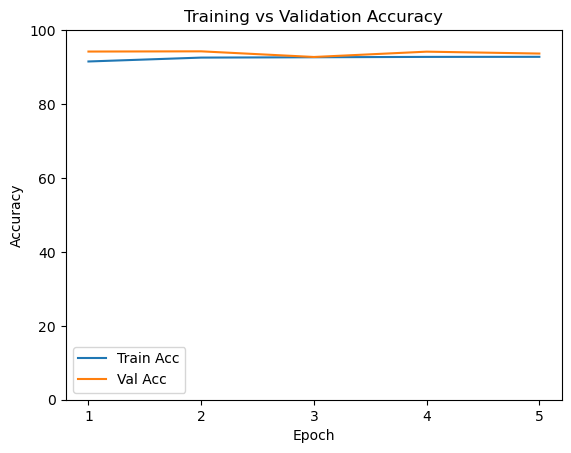

In [37]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Accuracy')
plt.plot(epochs,train_acc_list, label="Train Acc")
plt.plot(epochs,val_acc_list, label="Val Acc")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(epochs)
plt.ylim(0, 100)
plt.legend()
plt.show()

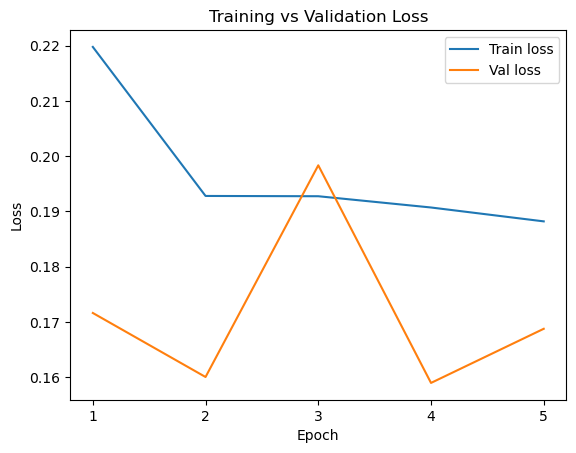

In [38]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Loss')
plt.plot(epochs,train_loss_list, label="Train loss")
plt.plot(epochs,val_loss_list, label="Val loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epochs)
plt.legend()
plt.show()

              precision    recall  f1-score   support

           0       0.93      0.98      0.96      7152
           1       0.95      0.83      0.89      2989

    accuracy                           0.94     10141
   macro avg       0.94      0.91      0.92     10141
weighted avg       0.94      0.94      0.94     10141



[Text(0, 0.5, 'Organic'), Text(0, 1.5, 'Non-Organic')]

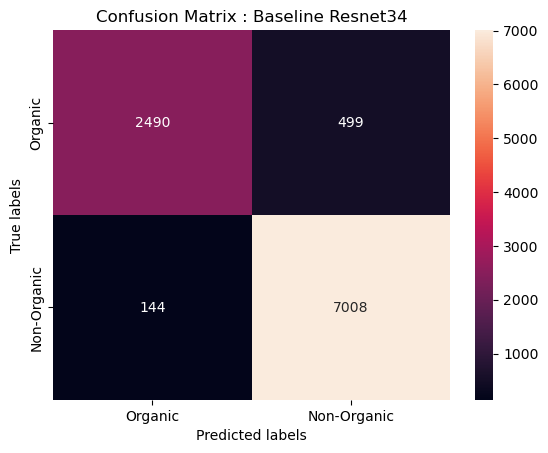

In [39]:
cm = confusion_matrix(all_labels, all_predictions, labels=[1,0])
print(classification_report(all_labels, all_predictions))

ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax);

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix : Baseline Resnet34'); 
ax.xaxis.set_ticklabels(['Organic', 'Non-Organic']); ax.yaxis.set_ticklabels(['Organic', 'Non-Organic'])

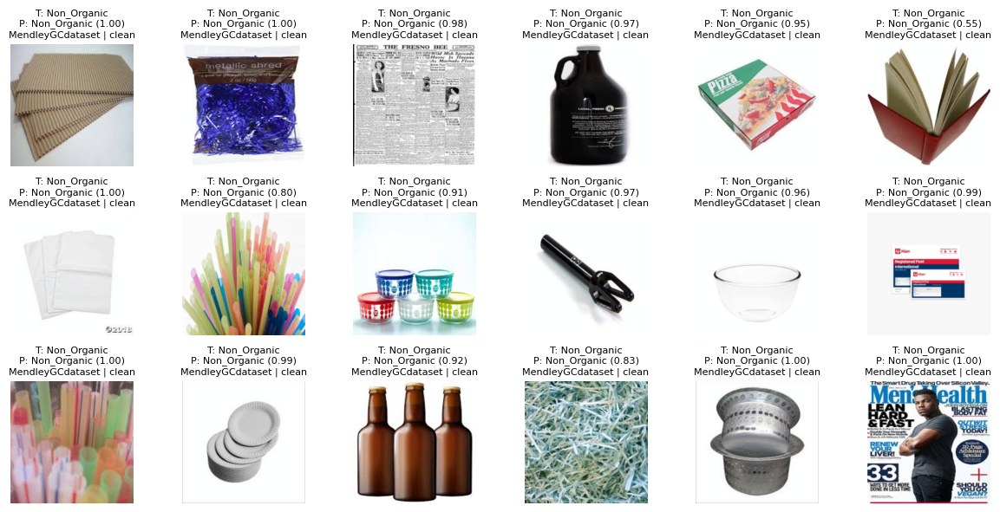

In [40]:
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)

    return img
    
images, labels, sources, type_images = next(iter(val_loader_s1))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    outputs = model(images)

    probs = torch.softmax(outputs, dim=1)
    confs, preds = torch.max(probs, dim=1)

class_names = val_ds_stage1.classes

fig, axes = plt.subplots(3, 6, figsize=(12, 6))

for i, ax in enumerate(axes.flatten()):

    img = denormalize(images[i])
    true_label = class_names[labels[i]]
    pred_label = class_names[preds[i]]
    conf = confs[i].item()

    src = sources[i]
    type_image = type_images[i]

    ax.imshow(img)
    ax.set_title(
        f"T: {true_label}\nP: {pred_label} ({conf:.2f})\n"
        f"{src} | {type_image}",fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [41]:
print(model)

CNN_stage1_r34(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

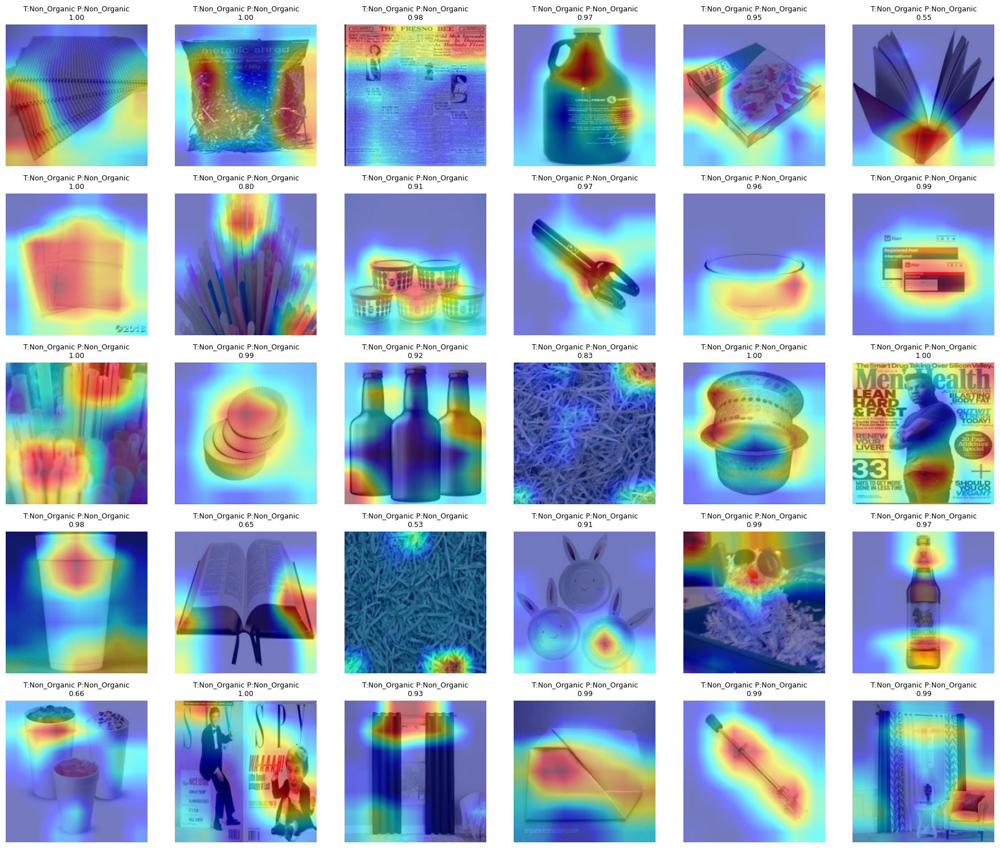

In [42]:
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

device = torch.device("mps")

model.to(device)
model.eval()

target_layers = [model.network.layer4[-1]]

for p in model.network.layer4.parameters():
    p.requires_grad = True

cam = GradCAM(
    model=model,
    target_layers=target_layers
)

# ---- Get ONE validation batch ----
images, labels, sources, type_images = next(iter(val_loader_s1))

images = images.to(device)

class_names = val_ds_stage1.classes

# Forward pass
outputs = model(images)
probs = torch.softmax(outputs, dim=1)
preds = torch.argmax(probs, dim=1)

targets = [ClassifierOutputTarget(p.item()) for p in preds]

grayscale_cams = cam(
    input_tensor=images,
    targets=targets
)

batch_size = images.size(0)

# ---- Grid settings ----
rows = 5
cols = 6
max_images = rows * cols

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(min(max_images, images.size(0))):

    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1,2,0).numpy()

    # Normalize for display (edit if using mean/std)
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    heatmap = grayscale_cams[i]

    visualization = show_cam_on_image(
        img_np,
        heatmap,
        use_rgb=True
    )

    plt.subplot(rows, cols, i + 1)
    plt.imshow(visualization)

    gt = labels[i].item()
    pred = preds[i].item()
    gt_lab = class_names[labels[i]]
    pred_lab = class_names[preds[i]]
    conf = probs[i][pred].item()

    plt.title(f"T:{gt_lab} P:{pred_lab}\n{conf:.2f}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()


### Building the CNN architecture - MobilenetV2

In [43]:
from torchvision.models import mobilenet_v2, MobileNet_V2_Weights
class CNN_stage1_mnv2(torch.nn.Module):
    def __init__(self, num_classes, input_size=(224, 224), channels=3):
        super(CNN_stage1_mnv2, self).__init__()

        self.input_size = input_size
        self.channels = channels

        self.network = mobilenet_v2(weights=MobileNet_V2_Weights.DEFAULT)

        num_features = self.network.classifier[1].in_features
        self.network.classifier[1] = torch.nn.Linear(num_features, 2)

    def forward(self, x):
        return self.network(x)

    def freeze(self):

        # Freeze all layers
        for param in self.network.parameters():
            param.requires_grad = False

        # Unfreeze final classifier layer
        for param in self.network.classifier.parameters():
            param.requires_grad = True

    def unfreeze(self):

        for param in self.network.parameters():
            param.requires_grad = True

In [44]:
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device("mps")
model_mnv2 = CNN_stage1_mnv2(2).to(device)

model_mnv2.freeze()   

learning_rate = 0.001

optimizer = torch.optim.Adam(
    model_mnv2.parameters(),
    lr=learning_rate
)

criterion = torch.nn.CrossEntropyLoss()
num_epochs = 5
batch_size = 32

In [45]:
total_params = sum(p.numel() for p in model_mnv2.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 2226434


In [143]:
import time

start = time.time()

for i, (imgs, labels, sources, type_images) in enumerate(train_loader_s1):
    if i == 50:
        break

print("50 batches time:", time.time() - start)

50 batches time: 4.613411903381348


In [46]:
# Training loop
epoch_times = []
train_acc_list = []
train_loss_list = []
val_acc_list = []
val_loss_list= []
for epoch in range(num_epochs):
    start = time.time()
    model_mnv2.train()
    running_loss = 0.0
    train_loss = 0.0
    train_accuracy = 0.0
    all_predictions = []
    all_labels = []
    for images, labels, sources, type_images in train_loader_s1:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model_mnv2(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Average loss and accuracy
    train_loss = running_loss / len(train_loader_s1)
    train_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    train_loss_list.append(train_loss)
    train_acc_list.append(train_accuracy)
        
    end = time.time()
    epoch_time = end - start
    epoch_times.append(epoch_time)

    print(f"Epoch {epoch+1} time: {epoch_time:.2f} sec")
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.4f}')
    

    model_mnv2.eval()
    all_predictions = []
    all_labels = []
    running_loss = 0.0
    val_loss = 0.0
    val_accuracy = 0.0
    with torch.no_grad():
        for images, labels, sources, type_images in val_loader_s1:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_mnv2(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss = running_loss / len(val_loader_s1)
    val_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    val_loss_list.append(val_loss)
    val_acc_list.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Accuracy: {val_accuracy:.4f}')
    print('-----------------------------')

total_time = sum(epoch_times)
print(f"Total training time: {total_time/60:.2f} minutes")


/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1 time: 255.62 sec
Epoch [1/5], Training Loss: 0.2000
Epoch [1/5], Training Accuracy: 92.4203
Epoch [1/5], Validation Loss: 0.1364
Epoch [1/5], Validation Accuracy: 95.3555
-----------------------------
Epoch 2 time: 251.67 sec
Epoch [2/5], Training Loss: 0.1747
Epoch [2/5], Training Accuracy: 93.3121
Epoch [2/5], Validation Loss: 0.1313
Epoch [2/5], Validation Accuracy: 95.4935
-----------------------------
Epoch 3 time: 249.69 sec
Epoch [3/5], Training Loss: 0.1717
Epoch [3/5], Training Accuracy: 93.5234
Epoch [3/5], Validation Loss: 0.1280
Epoch [3/5], Validation Accuracy: 95.6217
-----------------------------
Epoch 4 time: 251.51 sec
Epoch [4/5], Training Loss: 0.1774
Epoch [4/5], Training Accuracy: 93.3163
Epoch [4/5], Validation Loss: 0.1257
Epoch [4/5], Validation Accuracy: 95.4935
-----------------------------
Epoch 5 time: 252.86 sec
Epoch [5/5], Training Loss: 0.1750
Epoch [5/5], Training Accuracy: 93.3353
Epoch [5/5], Validation Loss: 0.1273
Epoch [5/5], Validation Acc

In [47]:
# Validation
model_mnv2.eval()
all_predictions = []
all_labels = []
start = time.time()
with torch.no_grad():
    for images, labels, sources, type_images in val_loader_s1:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_mnv2(images)
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

end = time.time()
num_images= len(val_loader_s1.dataset)
avg_time = (end - start) / num_images
throughput = num_images / (end - start)

print(f"Inference time per image: {avg_time*1000:.2f} ms")
print(f"Throughput: {throughput:.2f} images/sec")

# Calculate metrics
accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
f1 = f1_score(all_labels, all_predictions, average='weighted')
balanced_acccuracy=100 * balanced_accuracy_score(all_labels, all_predictions)
mcc = matthews_corrcoef(all_labels, all_predictions)


print(f'Accuracy on test set: {accuracy:.2f}%')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Balanced Accuracy on test set: {balanced_acccuracy:.2f}%')
print(f'MCC is: {mcc:.2f}')
print('-----------------------------')

Inference time per image: 4.09 ms
Throughput: 244.57 images/sec
Accuracy on test set: 95.46%
Precision: 0.9545
Recall: 0.9546
F1 Score: 0.9543
Balanced Accuracy on test set: 93.75%
MCC is: 0.89
-----------------------------


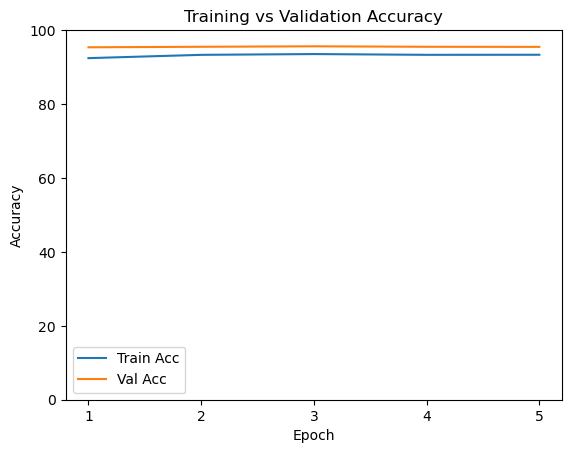

In [48]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Accuracy')
plt.plot(epochs,train_acc_list, label="Train Acc")
plt.plot(epochs,val_acc_list, label="Val Acc")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(epochs)
plt.ylim(0, 100)
plt.legend()
plt.show()

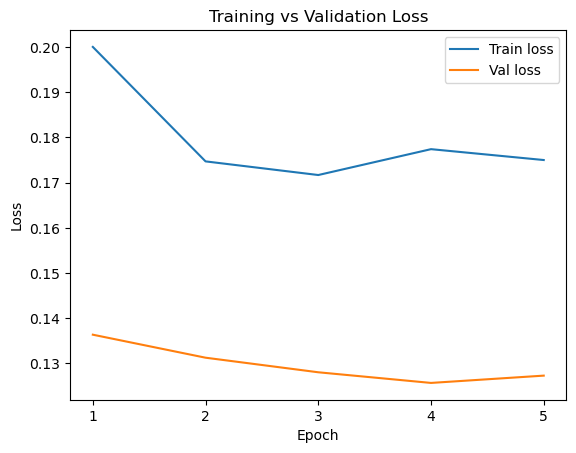

In [49]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Loss')
plt.plot(epochs,train_loss_list, label="Train loss")
plt.plot(epochs,val_loss_list, label="Val loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epochs)
plt.legend()
plt.show()

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      7152
           1       0.95      0.90      0.92      2989

    accuracy                           0.95     10141
   macro avg       0.95      0.94      0.94     10141
weighted avg       0.95      0.95      0.95     10141



[Text(0, 0.5, 'Organic'), Text(0, 1.5, 'Non-Organic')]

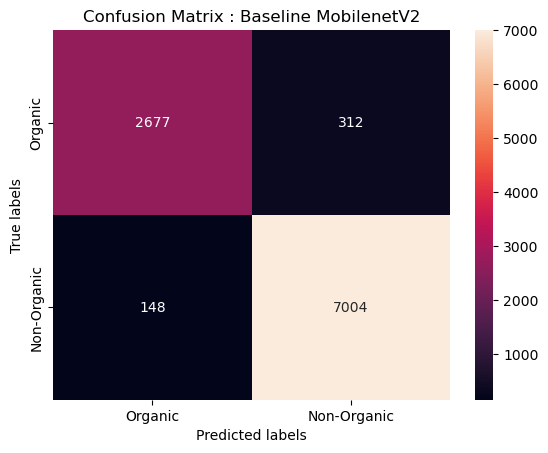

In [50]:
cm = confusion_matrix(all_labels, all_predictions, labels=[1,0])
print(classification_report(all_labels, all_predictions))

ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax);

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix : Baseline MobilenetV2'); 
ax.xaxis.set_ticklabels(['Organic', 'Non-Organic']); ax.yaxis.set_ticklabels(['Organic', 'Non-Organic'])

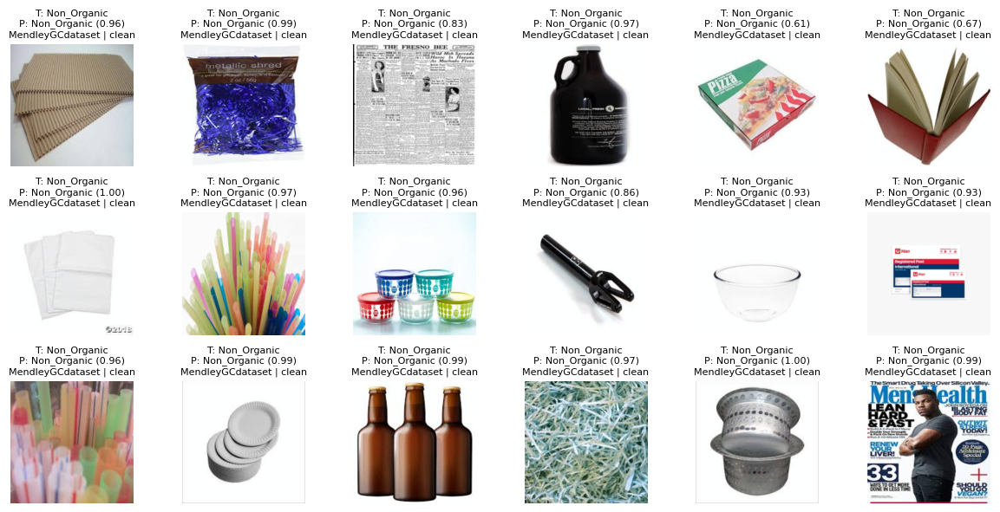

In [51]:
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)

    return img
    
images, labels, sources, type_images = next(iter(val_loader_s1))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    outputs = model_mnv2(images)

    probs = torch.softmax(outputs, dim=1)
    confs, preds = torch.max(probs, dim=1)

class_names = val_ds_stage1.classes

fig, axes = plt.subplots(3, 6, figsize=(12, 6))

for i, ax in enumerate(axes.flatten()):

    img = denormalize(images[i])
    true_label = class_names[labels[i]]
    pred_label = class_names[preds[i]]
    conf = confs[i].item()

    src = sources[i]
    type_image = type_images[i]

    ax.imshow(img)
    ax.set_title(
        f"T: {true_label}\nP: {pred_label} ({conf:.2f})\n"
        f"{src} | {type_image}",fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [52]:
print(model_mnv2)

CNN_stage1_mnv2(
  (network): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_siz

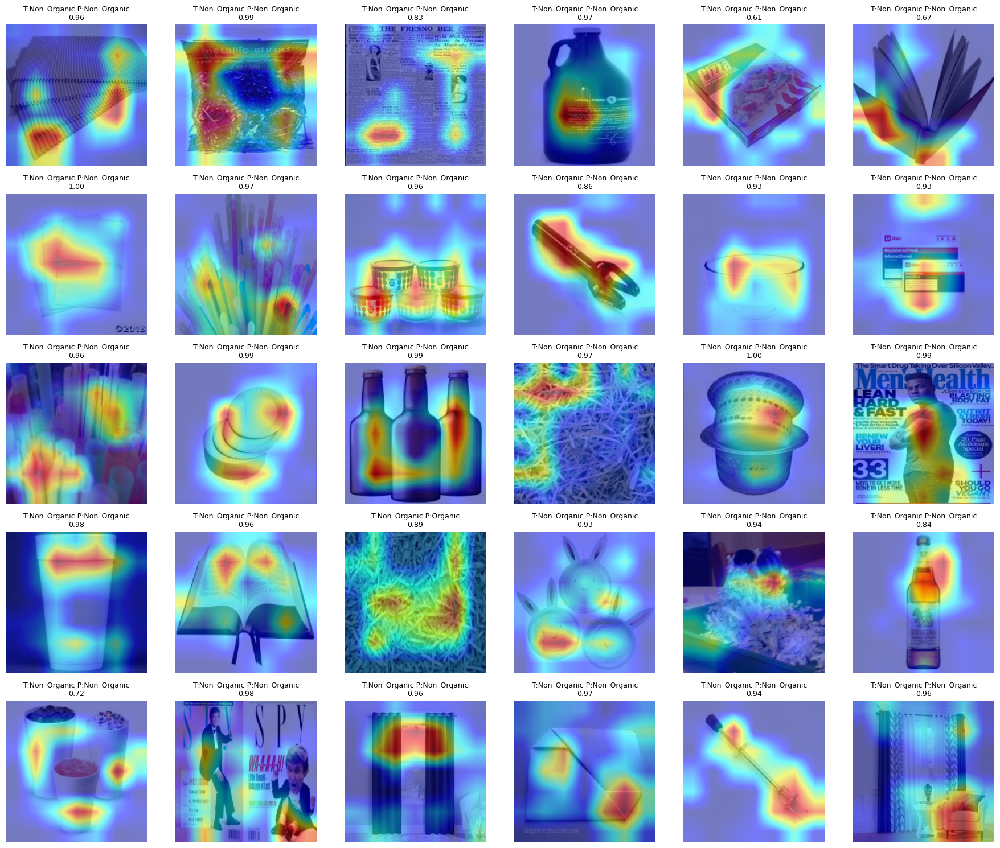

In [53]:
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

device = torch.device("mps")

model_mnv2.to(device)
model_mnv2.eval()

target_layers = [model_mnv2.network.features[-1]]

for p in model_mnv2.network.features[-1].parameters():
    p.requires_grad = True

cam = GradCAM(
    model=model_mnv2,
    target_layers=target_layers
)

# ---- Get ONE validation batch ----
images, labels, sources, type_images = next(iter(val_loader_s1))

images = images.to(device)

class_names = val_ds_stage1.classes

# Forward pass
outputs = model_mnv2(images)
probs = torch.softmax(outputs, dim=1)
preds = torch.argmax(probs, dim=1)

targets = [ClassifierOutputTarget(p.item()) for p in preds]

grayscale_cams = cam(
    input_tensor=images,
    targets=targets
)

batch_size = images.size(0)

# ---- Grid settings ----
rows = 5
cols = 6
max_images = rows * cols

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(min(max_images, images.size(0))):

    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1,2,0).numpy()

    # Normalize for display (edit if using mean/std)
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    heatmap = grayscale_cams[i]

    visualization = show_cam_on_image(
        img_np,
        heatmap,
        use_rgb=True
    )

    plt.subplot(rows, cols, i + 1)
    plt.imshow(visualization)

    gt = labels[i].item()
    pred = preds[i].item()
    gt_lab = class_names[labels[i]]
    pred_lab = class_names[preds[i]]
    conf = probs[i][pred].item()

    plt.title(f"T:{gt_lab} P:{pred_lab}\n{conf:.2f}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()


### Building the CNN architecture - Densenet-121

In [54]:
from torchvision.models import densenet121, DenseNet121_Weights
class CNN_stage1_dn121(torch.nn.Module):
    def __init__(self, num_classes, input_size=(224, 224), channels=3):
        super(CNN_stage1_dn121, self).__init__()

        self.input_size = input_size
        self.channels = channels

        self.network = densenet121(weights=DenseNet121_Weights.DEFAULT)

        num_features = self.network.classifier.in_features
        self.network.classifier = torch.nn.Linear(num_features, 2)

    def forward(self, x):
        return self.network(x)

    def freeze(self):

        # Freeze all layers
        for param in self.network.parameters():
            param.requires_grad = False

        # Unfreeze final classifier layer
        for param in self.network.classifier.parameters():
            param.requires_grad = True

    def unfreeze(self):

        for param in self.network.parameters():
            param.requires_grad = True

In [55]:
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device("mps")
model_dn121 = CNN_stage1_dn121(2).to(device)

model_dn121.freeze()   

learning_rate = 0.001

optimizer = torch.optim.Adam(
    model_dn121.parameters(),
    lr=learning_rate
)

criterion = torch.nn.CrossEntropyLoss()
num_epochs = 5
batch_size = 32

In [56]:
total_params = sum(p.numel() for p in model_dn121.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 6955906


In [57]:
import time

start = time.time()

for i, (imgs, labels, sources, type_images) in enumerate(train_loader_s1):
    if i == 50:
        break

print("50 batches time:", time.time() - start)

50 batches time: 5.590678930282593


In [59]:
# Training loop
epoch_times = []
train_acc_list = []
train_loss_list = []
val_acc_list = []
val_loss_list= []
for epoch in range(num_epochs):
    start = time.time()
    model_dn121.train()
    running_loss = 0.0
    train_loss = 0.0
    train_accuracy = 0.0
    all_predictions = []
    all_labels = []
    for images, labels, sources, type_images in train_loader_s1:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model_dn121(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Average loss and accuracy
    train_loss = running_loss / len(train_loader_s1)
    train_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    train_loss_list.append(train_loss)
    train_acc_list.append(train_accuracy)
        
    end = time.time()
    epoch_time = end - start
    epoch_times.append(epoch_time)

    print(f"Epoch {epoch+1} time: {epoch_time:.2f} sec")
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Accuracy: {train_accuracy:.4f}')
    

    model_dn121.eval()
    all_predictions = []
    all_labels = []
    running_loss = 0.0
    val_loss = 0.0
    val_accuracy = 0.0
    with torch.no_grad():
        for images, labels, sources, type_images in val_loader_s1:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_dn121(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_loss = running_loss / len(val_loader_s1)
    val_accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)

    val_loss_list.append(val_loss)
    val_acc_list.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Loss: {val_loss:.4f}')
    print(f'Epoch [{epoch+1}/{num_epochs}], Validation Accuracy: {val_accuracy:.4f}')
    print('-----------------------------')

total_time = sum(epoch_times)
print(f"Total training time: {total_time/60:.2f} minutes")


/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1 time: 410.02 sec
Epoch [1/5], Training Loss: 0.1726
Epoch [1/5], Training Accuracy: 93.6248
Epoch [1/5], Validation Loss: 0.1655
Epoch [1/5], Validation Accuracy: 94.1426
-----------------------------
Epoch 2 time: 413.70 sec
Epoch [2/5], Training Loss: 0.1700
Epoch [2/5], Training Accuracy: 93.6649
Epoch [2/5], Validation Loss: 0.1538
Epoch [2/5], Validation Accuracy: 94.5962
-----------------------------
Epoch 3 time: 410.68 sec
Epoch [3/5], Training Loss: 0.1678
Epoch [3/5], Training Accuracy: 93.7812
Epoch [3/5], Validation Loss: 0.1474
Epoch [3/5], Validation Accuracy: 94.7441
-----------------------------
Epoch 4 time: 408.57 sec
Epoch [4/5], Training Loss: 0.1697
Epoch [4/5], Training Accuracy: 93.7495
Epoch [4/5], Validation Loss: 0.1772
Epoch [4/5], Validation Accuracy: 93.5213
-----------------------------
Epoch 5 time: 409.78 sec
Epoch [5/5], Training Loss: 0.1743
Epoch [5/5], Training Accuracy: 93.5445
Epoch [5/5], Validation Loss: 0.1395
Epoch [5/5], Validation Acc

In [60]:
# Validation
model_dn121.eval()
all_predictions = []
all_labels = []
start = time.time()
with torch.no_grad():
    for images, labels, sources, type_images in val_loader_s1:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model_dn121(images)
        _, predicted = torch.max(outputs.data, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

end = time.time()
num_images= len(val_loader_s1.dataset)
avg_time = (end - start) / num_images
throughput = num_images / (end - start)

print(f"Inference time per image: {avg_time*1000:.2f} ms")
print(f"Throughput: {throughput:.2f} images/sec")


# Calculate metrics
accuracy = 100 * sum(np.array(all_predictions) == np.array(all_labels)) / len(all_labels)
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
f1 = f1_score(all_labels, all_predictions, average='weighted')
balanced_acccuracy=100 * balanced_accuracy_score(all_labels, all_predictions)
mcc = matthews_corrcoef(all_labels, all_predictions)

print(f'Accuracy on test set: {accuracy:.2f}%')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Balanced Accuracy on test set: {balanced_acccuracy:.2f}%')
print(f'MCC is: {mcc:.2f}')
print('-----------------------------')

/opt/anaconda3/envs/t3_project/lib/python3.11/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Inference time per image: 6.74 ms
Throughput: 148.41 images/sec
Accuracy on test set: 94.82%
Precision: 0.9481
Recall: 0.9482
F1 Score: 0.9481
Balanced Accuracy on test set: 93.60%
MCC is: 0.88
-----------------------------


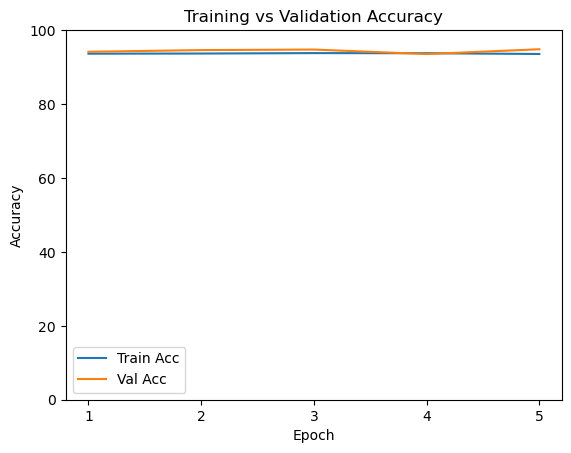

In [61]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Accuracy')
plt.plot(epochs,train_acc_list, label="Train Acc")
plt.plot(epochs,val_acc_list, label="Val Acc")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(epochs)
plt.ylim(0, 100)
plt.legend()
plt.show()

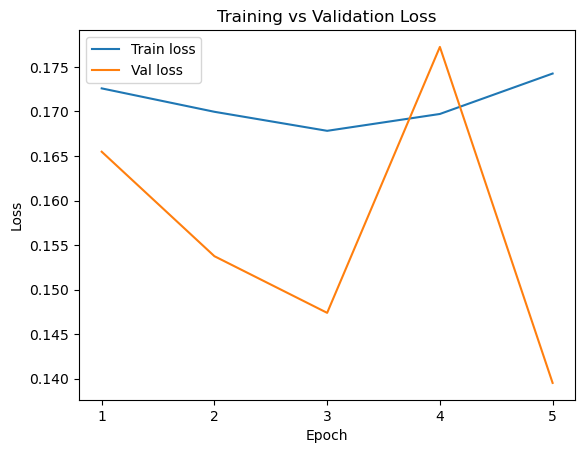

In [62]:
epochs = range(1, num_epochs+1)
plt.title('Training vs Validation Loss')
plt.plot(epochs,train_loss_list, label="Train loss")
plt.plot(epochs,val_loss_list, label="Val loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(epochs)
plt.legend()
plt.show()

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      7152
           1       0.92      0.91      0.91      2989

    accuracy                           0.95     10141
   macro avg       0.94      0.94      0.94     10141
weighted avg       0.95      0.95      0.95     10141



[Text(0, 0.5, 'Organic'), Text(0, 1.5, 'Non-Organic')]

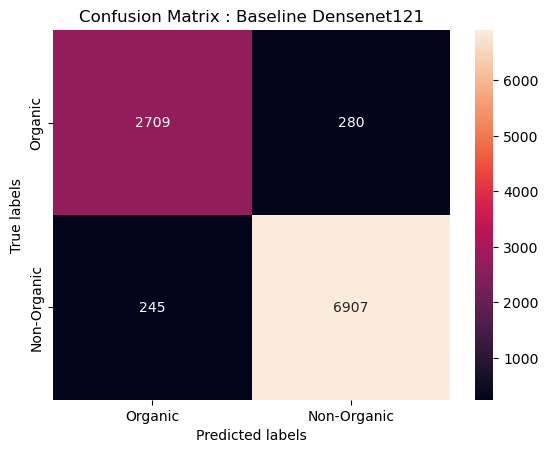

In [63]:
cm = confusion_matrix(all_labels, all_predictions, labels=[1,0])
print(classification_report(all_labels, all_predictions))

ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax);

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix : Baseline Densenet121'); 
ax.xaxis.set_ticklabels(['Organic', 'Non-Organic']); ax.yaxis.set_ticklabels(['Organic', 'Non-Organic'])

In [2]:
def denormalize(img):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = img.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)

    return img
    
images, labels, sources, type_images = next(iter(val_loader_s1))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    outputs = model_dn121(images)

    probs = torch.softmax(outputs, dim=1)
    confs, preds = torch.max(probs, dim=1)

class_names = val_ds_stage1.classes

fig, axes = plt.subplots(3, 6, figsize=(12, 6))

for i, ax in enumerate(axes.flatten()):

    img = denormalize(images[i])
    true_label = class_names[labels[i]]
    pred_label = class_names[preds[i]]
    conf = confs[i].item()

    src = sources[i]
    type_image = type_images[i]

    ax.imshow(img)
    ax.set_title(
        f"T: {true_label}\nP: {pred_label} ({conf:.2f})\n"
        f"{src} | {type_image}",fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

NameError: name 'val_loader_s1' is not defined

In [64]:
print(model_dn121)

CNN_stage1_dn121(
  (network): DenseNet(
    (features): Sequential(
      (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu0): ReLU(inplace=True)
      (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (denseblock1): _DenseBlock(
        (denselayer1): _DenseLayer(
          (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu1): ReLU(inplace=True)
          (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu2): ReLU(inplace=True)
          (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        )
        (denselayer2): _DenseLayer(
          (norm1): BatchNorm2d(96, eps=1e-05, mom

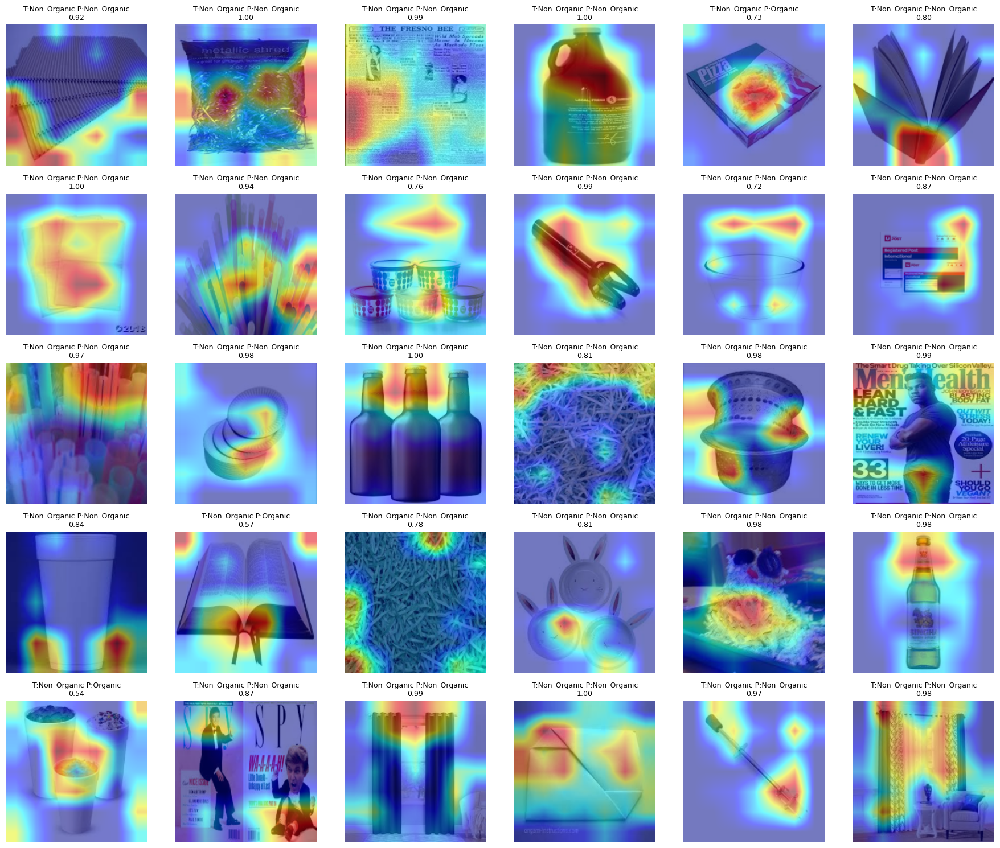

In [65]:
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

device = torch.device("mps")

model_dn121.to(device)
model_dn121.eval()

target_layers = [model_dn121.network.features[-1]]

for p in model_dn121.network.features[-1].parameters():
    p.requires_grad = True

cam = GradCAM(
    model=model_dn121,
    target_layers=target_layers
)

# ---- Get ONE validation batch ----
images, labels, sources, type_images = next(iter(val_loader_s1))

images = images.to(device)

class_names = val_ds_stage1.classes

# Forward pass
outputs = model_dn121(images)
probs = torch.softmax(outputs, dim=1)
preds = torch.argmax(probs, dim=1)

targets = [ClassifierOutputTarget(p.item()) for p in preds]

grayscale_cams = cam(
    input_tensor=images,
    targets=targets
)

batch_size = images.size(0)

# ---- Grid settings ----
rows = 5
cols = 6
max_images = rows * cols

plt.figure(figsize=(cols * 3, rows * 3))

for i in range(min(max_images, images.size(0))):

    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1,2,0).numpy()

    # Normalize for display (edit if using mean/std)
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    heatmap = grayscale_cams[i]

    visualization = show_cam_on_image(
        img_np,
        heatmap,
        use_rgb=True
    )

    plt.subplot(rows, cols, i + 1)
    plt.imshow(visualization)

    gt = labels[i].item()
    pred = preds[i].item()
    gt_lab = class_names[labels[i]]
    pred_lab = class_names[preds[i]]
    conf = probs[i][pred].item()

    plt.title(f"T:{gt_lab} P:{pred_lab}\n{conf:.2f}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()
